# Street Flooding Complaints (SFC)

## Import Libraries

### Built-in Libraries

### External Libraries

In [12]:
import pyproj
import geopandas as gpd
import pandas as pd

## 311 Service Requests from 2010 to Present

### About

| Key | Value |
| --- | ----- |
| URL | https://data.cityofnewyork.us/Social-Services/311-Service-Requests-from-2010-to-Present/erm2-nwe9 |
| Description | All 311 Service Requests from 2010 to present. |
| Updated | 2023-02-13 |
| Views | 440K+ |
| Data Provided by | [311](https://data.cityofnewyork.us/browse?Dataset-Information_Agency=311), DoITT |
| Category | [Social Services](https://data.cityofnewyork.us/browse?category=Social+Services) |
| API Docs | https://dev.socrata.com/foundry/data.cityofnewyork.us/erm2-nwe9 |
| API Endpoints<br />(sample size: `10`) | [JSON](https://data.cityofnewyork.us/resource/erm2-nwe9.json?$limit=10&descriptor=Street%20Flooding%20(SJ))<br>[GeoJSON](https://data.cityofnewyork.us/resource/erm2-nwe9.geojson?$limit=10&descriptor=Street%20Flooding%20(SJ))<br>[CSV](https://data.cityofnewyork.us/resource/erm2-nwe9.csv?$limit=10&descriptor=Street%20Flooding%20(SJ)) |
| `complaint_type` | Sewer |
| `descriptor` | Street Flooding (SJ) |

### Define Variables

Default limit = 1000 

[Ref: Paging through Data](https://dev.socrata.com/docs/paging.html)

In [5]:
NYC_OPEN_DATA_311_API_JSON = 'https://data.cityofnewyork.us/resource/erm2-nwe9.json?descriptor=Street%20Flooding%20(SJ)'
NYC_OPEN_DATA_311_API_GEOJSON = 'https://data.cityofnewyork.us/resource/erm2-nwe9.geojson?descriptor=Street%20Flooding%20(SJ)'
NYC_OPEN_DATA_311_API_CSV = 'https://data.cityofnewyork.us/resource/erm2-nwe9.csv?descriptor=Street%20Flooding%20(SJ)'


### Download 311 Service Complaints for `Street Flooding (SJ)`

In [6]:
street_flooding_gdf = gpd.read_file(NYC_OPEN_DATA_311_API_GEOJSON, driver='GeoJSON')

### View Street Flooding Metadata

In [18]:
street_flooding_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1000 entries, 56795129 to 55960074
Data columns (total 44 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   location_state                  985 non-null    object        
 1   facility_type                   0 non-null      float64       
 2   intersection_street_2           189 non-null    object        
 3   city                            1000 non-null   object        
 4   location_zip                    985 non-null    object        
 5   park_borough                    1000 non-null   object        
 6   latitude                        985 non-null    object        
 7   road_ramp                       0 non-null      float64       
 8   created_date                    1000 non-null   datetime64[ns]
 9   agency                          1000 non-null   object        
 10  park_facility_name              1000 non-null   object    

### Convert `datetime64` data type to string

In [26]:
# created_date, resolution_action_updated_date, closed_date

street_flooding_gdf['created_date'] = street_flooding_gdf['created_date'].dt.strftime('%Y-%m-%d %H:%M:%S')
street_flooding_gdf['resolution_action_updated_date'] = street_flooding_gdf['resolution_action_updated_date'].dt.strftime('%Y-%m-%d %H:%M:%S')
street_flooding_gdf['closed_date'] = street_flooding_gdf['closed_date'].dt.strftime('%Y-%m-%d %H:%M:%S')


### Set Index as `unique_key`

In [17]:
street_flooding_gdf.set_index('unique_key', inplace=True)

### Remove Rows With Missing `geometry`

In [30]:
street_flooding_gdf.dropna(subset = ['geometry'], inplace = True)

### Preview Street Flooding Data

In [31]:
street_flooding_gdf[['created_date', 'borough', 'bbl', 'geometry']].head(10)

,created_date,borough,bbl,geometry
unique_key,,,,
56795129,2023-02-13 20:23:00,QUEENS,NaN,POINT (-73.80189 40.76190)
56799815,2023-02-13 10:41:00,BROOKLYN,3030120011,POINT (-73.93062 40.70500)
56778746,2023-02-11 03:56:00,BROOKLYN,3068850023,POINT (-73.98458 40.59320)
56768787,2023-02-10 17:59:00,BROOKLYN,3030120011,POINT (-73.93062 40.70500)
56774622,2023-02-10 16:14:00,BROOKLYN,3080840023,POINT (-73.89755 40.63036)
56773457,2023-02-10 16:05:00,QUEENS,NaN,POINT (-73.79334 40.73268)
56771023,2023-02-10 14:02:00,BROOKLYN,NaN,POINT (-73.94758 40.72014)
56762823,2023-02-09 16:47:00,MANHATTAN,1015447502,POINT (-73.95318 40.77509)
56758534,2023-02-09 14:50:00,BRONX,2054110150,POINT (-73.82346 40.84382)


### View on Map

In [28]:
street_flooding_gdf['geometry'] = street_flooding_gdf.geometry

In [33]:
street_flooding_gdf.explore('borough')

In [7]:
nybb_df = gpd.read_file(gpd.datasets.get_path('nybb'))
# nybb_df.set_crs(epsg=3857, inplace=True)

In [8]:
nybb_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   BoroCode    5 non-null      int64   
 1   BoroName    5 non-null      object  
 2   Shape_Leng  5 non-null      float64 
 3   Shape_Area  5 non-null      float64 
 4   geometry    5 non-null      geometry
dtypes: float64(2), geometry(1), int64(1), object(1)
memory usage: 328.0+ bytes


In [9]:
nybb_df = nybb_df.set_index("BoroName")

In [10]:
nybb_df['area'] = nybb_df.area

In [11]:
nybb_df['boundary'] = nybb_df.boundary

In [12]:
nybb_df['centroid'] = nybb_df.centroid

<AxesSubplot: >

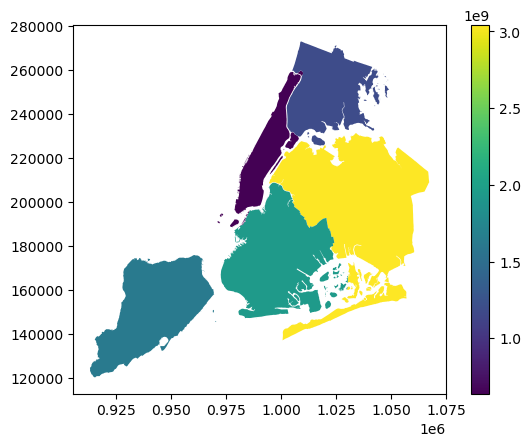

In [13]:
nybb_df.plot('area', legend=True)

In [14]:
nybb_df.explore("area", legend=False)

In [15]:
nybb_df.index

Index(['Staten Island', 'Queens', 'Brooklyn', 'Manhattan', 'Bronx'], dtype='object', name='BoroName')

In [16]:
nybb_df.columns

Index(['BoroCode', 'Shape_Leng', 'Shape_Area', 'geometry', 'area', 'boundary',
       'centroid'],
      dtype='object')

In [17]:
nybb_df.index

Index(['Staten Island', 'Queens', 'Brooklyn', 'Manhattan', 'Bronx'], dtype='object', name='BoroName')

In [18]:
nybb_df.head()

,BoroCode,Shape_Leng,Shape_Area,geometry,area,boundary,centroid
BoroName,,,,,,,
Staten Island,5,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",1.623822e+09,"MULTILINESTRING ((970217.022 145643.332, 97022...",POINT (941639.450 150931.991)
Queens,4,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957...",3.045214e+09,"MULTILINESTRING ((1029606.077 156073.814, 1029...",POINT (1034578.078 197116.604)
Brooklyn,3,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100...",1.937478e+09,"MULTILINESTRING ((1021176.479 151374.797, 1021...",POINT (998769.115 174169.761)
Manhattan,1,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940....",6.364712e+08,"MULTILINESTRING ((981219.056 188655.316, 98094...",POINT (993336.965 222451.437)
Bronx,2,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278...",1.186926e+09,"MULTILINESTRING ((1012821.806 229228.265, 1012...",POINT (1021174.790 249937.980)


In [19]:
nybb_df.dtypes

BoroCode         int64
Shape_Leng     float64
Shape_Area     float64
geometry      geometry
area           float64
boundary      geometry
centroid      geometry
dtype: object

In [20]:
nybb_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 5 entries, Staten Island to Bronx
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   BoroCode    5 non-null      int64   
 1   Shape_Leng  5 non-null      float64 
 2   Shape_Area  5 non-null      float64 
 3   geometry    5 non-null      geometry
 4   area        5 non-null      float64 
 5   boundary    5 non-null      geometry
 6   centroid    5 non-null      geometry
dtypes: float64(3), geometry(3), int64(1)
memory usage: 492.0+ bytes


In [21]:
print(type(list(nybb_df.index)))

<class 'list'>


In [22]:
nybb = gpd.read_file(gpd.datasets.get_path('nybb'))

In [23]:
nybb.explore()

In [24]:
nybb.explore(
     column="BoroName", # make choropleth based on "BoroName" column
     tooltip="BoroName", # show "BoroName" value in tooltip (on hover)
     popup=True, # show all values in popup (on click)
     tiles="CartoDB positron", # use "CartoDB positron" tiles
     cmap="Set1", # use "Set1" matplotlib colormap
     style_kwds=dict(color="black") # use black outline
    )

## References

### GeoPandas

[Reading and Writing Files | GoePandas Documentation](https://geopandas.org/en/stable/docs/user_guide/io.html)

### pyproj

[On fresh Conda installation of PyProj: pyproj unable to set database path. _pyproj_global_context_initialize()](https://stackoverflow.com/questions/69630630/on-fresh-conda-installation-of-pyproj-pyproj-unable-to-set-database-path-pypr)

#### Fix

Un-install pyproj

`conda remove --force pyproj`

Re-install pyproj via `pip` instead of `conda`

`pip install pyproj`
